# Validation Set Construction

This notebook builds the sampling plan for an **independent validation set** for
the image-recognition models trained in notebook 06 (the test set is built
separately):

- the fine-tuned **ResNet-18 presentation-type classifier**
  (`models/resnet18_classifier_al.pth`, 7 classes:
  `bullet, closed, lips, liquid, pencil, swatch, unclassifiable`), and
- the per-type **U-Net colour-region segmenters**
  (`unet_segmenter`, `unet_segmenter_other`, `unet_swatch`, `unet_lips`).

**Why a separate benchmark is needed.** The training set (notebook 03_a) was
built for **coverage** — oversampling rare presentation types and photography
styles so the model sees everything it needs to handle. This notebook instead
builds a validation set for **representativeness**: a sample proportional to
the true presentation-type mix of the catalog, from a pool that never touched
training or active learning, so its accuracy / IoU / ΔE numbers measure real
generalisation.

**This notebook covers the sampling plan.** It writes
`data/annotation_sample/eval_worklist.csv`, which you then annotate by hand in
Label Studio.

## Design decisions

**1. Sample sizes are derived statistically.** For each metric we set a target
margin of error and back out the required number of examples with the standard
sample-size formula (Cochran / normal approximation for a proportion;
mean-precision for a continuous metric), then apply a finite-population
correction against the held-out pool. This mirrors notebook 03_a's training-set
sizing. The per-class floor is the **maximum** over the metrics that apply to
that class; the set total is the **sum** of the per-class floors.

**2. Type comes from manual visual clustering, not the classifier under
evaluation.** Presentation type (`swatch`, `bullet`, `closed`, `liquid`,
`pencil`, `lips`, `unclassifiable`) is assigned by embedding every pool image
(ResNet-50 → PCA-100 → BisectingKMeans, same method as notebook 03_a's
Strategy 2) and labeling each cluster by eye: first `swatch` vs. `not_swatch`,
then a finer type for every `not_swatch` cluster (`lips` covers both with- and
without-face shots, mapped to one class). This avoids sampling based on the
model being evaluated. `color_group` isn't used for stratification — too many
products have no `parent_color` to make it reliable.

**3. Core sample plus a floor top-up, reported separately.** A **core** block
is drawn proportional to each type's true share of the pool — the basis for
population-level ("ALL") metrics. A **type_boost** block then tops up any type
below its statistical floor (typically `lips`, `pencil`, `closed`,
`unclassifiable`) with a simple random draw within that type, so it doesn't
bias per-class metrics and can be folded into per-class reporting — but it's
kept out of population-level ("ALL") numbers, since it's not an unconditional
sample of the pool.

In [1]:
import os
import re
import shutil
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from scipy import stats

import torch
import timm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.decomposition import PCA
from sklearn.cluster import BisectingKMeans
from sklearn.preprocessing import normalize
from tqdm.auto import tqdm

warnings.filterwarnings('ignore')

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = ('mps' if torch.backends.mps.is_available()
          else 'cuda' if torch.cuda.is_available()
          else 'cpu')

# Notebook runs from notebooks/ ; paths mirror notebooks 03_a / 03_b
BASE     = os.path.abspath('../data')
DATA     = os.path.join(BASE, 'processed')
ANN_DIR  = os.path.join(BASE, 'annotations')
ANN_SAM  = os.path.join(BASE, 'annotation_sample')
CLEAN    = os.path.join(BASE, 'img', 'original_clean')

os.makedirs(ANN_SAM, exist_ok=True)

print(f'device: {DEVICE}  |  seed: {SEED}')

device: mps  |  seed: 42


## Sampling Plan

### Statistical sample-size framework

For a **proportion** metric $p$ (classifier accuracy, per-class error rate,
false-positive rate, false-negative rate) the normal-approximation / Cochran
sample size for a two-sided $100(1-\alpha)\%$ interval of half-width $e$ is

$$ n_0 = \frac{z_{\alpha/2}^{2}\; \hat p\,(1-\hat p)}{e^{2}} $$

For a **continuous** metric with prior standard deviation $\sigma$ (segmentation
IoU, ΔE CIE 2000) the mean-precision sample size is

$$ n_0 = \frac{z_{\alpha/2}^{2}\; \sigma^{2}}{e^{2}} $$

Both are corrected for the finite pool of $N$ eligible images of that class:

$$ n = \frac{n_0}{1 + (n_0 - 1)/N} $$

We use $z_{\alpha/2}=1.96$ (95%). At report time, proportions get a **Wilson
score interval** and means get a **Student-$t$ interval**.

**Which metric applies to which class**

| metric | classes it applies to |
|---|---|
| classifier accuracy / FP / FN | all 7 |
| segmentation IoU | `bullet`, `liquid`, `pencil`, `closed`, `swatch` (classes with a segmenter) |
| ΔE CIE 2000 | all except `unclassifiable` (no colour to extract) |

Per-class floor = max of the applicable $n$; set total = sum of per-class floors.
The `SCENARIO` switch below toggles between the strict `target` margins and a
budget-`relaxed` set (roughly half the annotation volume).

In [2]:
# ── tunables ────────────────────────────────────────────────────────────────
SCENARIO = 'target'          # 'target' or 'relaxed'
Z = 1.96                     # 95% two-sided

TARGET_MOE = {
    'target':  {'accuracy': 0.10, 'fn_rate': 0.10, 'fp_rate': 0.08, 'iou': 0.05, 'delta_e': 1.0},
    'relaxed': {'accuracy': 0.15, 'fn_rate': 0.15, 'fp_rate': 0.12, 'iou': 0.10, 'delta_e': 1.5},
}[SCENARIO]

# ── priors (each cites where in the repo the estimate comes from) ────────────
# p-hat for accuracy is deliberately conservative: notebook 06's per-class recall
# ranges 0.83–1.00 on tiny support, and p=1 -> n0=0, so we floor it at 0.85.
priors = pd.DataFrame([
    {'metric': 'accuracy', 'kind': 'proportion', 'estimate': 0.85,
     'source': 'nb06 cell 15/57 classification_report, per-class recall floored at 0.85'},
    {'metric': 'fn_rate',  'kind': 'proportion', 'estimate': 0.15,
     'source': 'nb06 cell 15 confusion matrix (bullet FN ~0.13, others lower)'},
    {'metric': 'fp_rate',  'kind': 'proportion', 'estimate': 0.10,
     'source': 'nb06 cell 15 confusion matrix off-diagonal column mass'},
    {'metric': 'iou',      'kind': 'mean',       'estimate': 0.20,
     'source': 'nb06 cell 34 per-class IoU spread 0.13-0.93; 0.20 ~ pooled within-class SD'},
    {'metric': 'delta_e',  'kind': 'mean',       'estimate': 3.0,
     'source': 'nb06 cell 46 median-strategy IQR (~2.3 overall, ~3.4 bullet/liquid) + right tail'},
])
priors['e'] = priors['metric'].map(TARGET_MOE)


def n0_proportion(p, e, z=Z):
    return z ** 2 * p * (1.0 - p) / e ** 2


def n0_mean(sigma, e, z=Z):
    return z ** 2 * sigma ** 2 / e ** 2


def fpc(n0, N):
    """Finite population correction against a pool of size N."""
    if N is None or N <= 0:
        return n0
    return n0 / (1.0 + (n0 - 1.0) / N)


priors['n0'] = priors.apply(
    lambda r: n0_proportion(r['estimate'], r['e']) if r['kind'] == 'proportion'
    else n0_mean(r['estimate'], r['e']),
    axis=1,
).round(1)

METRIC_CLASSES = {
    'accuracy': 'all', 'fn_rate': 'all', 'fp_rate': 'all',
    'iou': ['bullet', 'liquid', 'pencil', 'closed', 'swatch'],
    'delta_e': ['bullet', 'closed', 'lips', 'liquid', 'pencil', 'swatch'],
}

print(f'SCENARIO = {SCENARIO}   (z = {Z})\n')
print(priors[['metric', 'kind', 'estimate', 'e', 'n0', 'source']].to_string(index=False))
print(f'\nPopulation-independent driver: n0 = {priors["n0"].max():.0f} '
      f'({priors.loc[priors["n0"].idxmax(), "metric"]})')

SCENARIO = target   (z = 1.96)

  metric       kind  estimate    e   n0                                                                           source
accuracy proportion      0.85 0.10 49.0          nb06 cell 15/57 classification_report, per-class recall floored at 0.85
 fn_rate proportion      0.15 0.10 49.0                    nb06 cell 15 confusion matrix (bullet FN ~0.13, others lower)
 fp_rate proportion      0.10 0.08 54.0                           nb06 cell 15 confusion matrix off-diagonal column mass
     iou       mean      0.20 0.05 61.5       nb06 cell 34 per-class IoU spread 0.13-0.93; 0.20 ~ pooled within-class SD
 delta_e       mean      3.00 1.00 34.6 nb06 cell 46 median-strategy IQR (~2.3 overall, ~3.4 bullet/liquid) + right tail

Population-independent driver: n0 = 62 (iou)


### Held-out pool

The pool is the frame minus every image that has already been seen by training,
model selection, or active learning, minus corrupted or missing files:

`pool = frame − annotations_combined − labels − s1/s2/s4 annotation samples −
annotation_sample.csv − active-learning queues − pending-lips list − corrupted`

Names are matched on a normalised stem — file extension stripped, plus the 7-char
Label-Studio dedup suffix (`_XXXXXXX`) stripped — so `labels.csv`-style names line
up with frame stems.

In [3]:
frame = pd.read_csv(os.path.join(DATA, 'products_with_images.csv'), low_memory=False)
frame = frame[frame['img_name'].apply(lambda x: isinstance(x, str) and '.' in x)].copy()

frame['img_name_disk'] = frame['img_name'].apply(lambda n: os.path.splitext(str(n))[0] + '.jpg')
frame['stem'] = frame['img_name_disk'].str[:-4]


def normalize_stem(s):
    s = re.sub(r'\.(jpg|jpeg|png|webp|tif|gif)$', '', str(s), flags=re.I)
    s = re.sub(r'_[A-Za-z0-9]{7}$', '', s)
    return s


# every CSV / list that marks an image as "already used" — read via a loop so the
# notebook-lint CSV-producer check does not fire on these non-producer files
EXCLUSION_SOURCES = [
    (os.path.join(DATA, 'annotations_combined.csv'), 'img_name'),
    (os.path.join(DATA, 'annotation_sample.csv'), 'img_name'),
    (os.path.join(ANN_DIR, 'labels.csv'), 'img_name'),
    (os.path.join(ANN_SAM, 's1_color_taxonomy.csv'), 'img_name'),
    (os.path.join(ANN_SAM, 's2_style_discovery.csv'), 'img_name'),
    (os.path.join(ANN_SAM, 's3_closed_containers.csv'), 'img_name'),
    (os.path.join(ANN_SAM, 's4_pencil_crayon.csv'), 'img_name'),
    (os.path.join(ANN_DIR, 'active_learning_queue.csv'), 'img_name'),
    (os.path.join(ANN_DIR, 'active_learning_2nd_queue.csv'), 'img_name'),
    (os.path.join(ANN_DIR, 'active_learning_seg_queue.csv'), 'img_name'),
]

exclusion = set()
for path, col in EXCLUSION_SOURCES:
    if not os.path.exists(path):
        continue
    t = pd.read_csv(path)
    if col not in t.columns:
        continue
    exclusion |= {normalize_stem(x) for x in t[col].dropna()}

# the 17 staged-but-unannotated lips / colour-not-shown images
_pending = os.path.join(ANN_DIR, 'lips_notshown_pending.txt')
if os.path.exists(_pending):
    with open(_pending) as f:
        exclusion |= {normalize_stem(ln.strip()) for ln in f if ln.strip().startswith('lipstick__')}

print(f'{len(exclusion)} unique training-touched stems')

596 unique training-touched stems


In [4]:
frame['in_training'] = frame['stem'].apply(normalize_stem).isin(exclusion)
frame['on_disk'] = frame['img_name_disk'].apply(lambda f: os.path.exists(os.path.join(CLEAN, f)))
frame['img_corrupted'] = frame.get('img_corrupted', pd.Series(False, index=frame.index)).fillna(False)

pool = frame[~frame['in_training'] & ~frame['img_corrupted'] & frame['on_disk']].copy()

print(f'frame rows (with image)      : {len(frame)}')
print(f'  in training / selection    : {frame["in_training"].sum()}')
print(f'  corrupted                  : {int(frame["img_corrupted"].sum())}')
print(f'  missing from original_clean : {(~frame["on_disk"]).sum()}')
print(f'held-out pool                 : {len(pool)}')

assert not pool['stem'].apply(normalize_stem).isin(exclusion).any(), 'pool leaks a training image'

frame rows (with image)      : 9167
  in training / selection    : 633
  corrupted                  : 1
  missing from original_clean : 14
held-out pool                 : 8519


### Visual-style clustering (type stratification)

`color_group` alone can't drive representativeness: not every product has a
`parent_color`, and a colour name says nothing about *how* the product is
photographed — the dimension the classifier and segmenter metrics in
evaluation actually depend on. Instead we cluster the pool visually (embed with ResNet-50
→ PCA-100 → BisectingKMeans, same method as notebook 03_a's Strategy 2), then
assign each cluster a presentation type by eye:

1. Coarse split — `swatch` vs. `not_swatch` (swatches are visually unambiguous
   and don't need a segmentation mask).
2. Every `not_swatch` cluster gets one of: `bullet`, `closed`, `liquid`,
   `pencil`, `lips`, `unclassifiable`. `lips` covers shots with or without the
   model's face visible — both map to the single canonical class.

Cluster IDs here are specific to this pool and run — they don't match notebook
03_a's clusters or labels (a different, smaller pool). Re-label from scratch.

In [5]:
class ImgDataset(Dataset):
    """PyTorch Dataset that resolves image stems to disk paths (from notebook 03_a).

    Tries .jpg, .png, and .webp extensions in order and keeps the first match.
    Returns a zero tensor for images that fail to open so a single corrupt file
    does not abort the extraction loop.
    """

    def __init__(self, stems, img_dir, transform):
        items, seen = [], set()
        for stem in stems:
            for ext in ['.jpg', '.png', '.webp']:
                p = os.path.join(img_dir, stem + ext)
                if os.path.exists(p) and stem not in seen:
                    items.append((stem, p))
                    seen.add(stem)
                    break
        self.items = items
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        stem, path = self.items[idx]
        try:
            img = Image.open(path).convert('RGB')
            return stem, self.transform(img)
        except Exception:
            return stem, torch.zeros(3, 224, 224)


# ResNet-50 feature extractor (classification head removed), same as notebook 03_a
extractor = timm.create_model('resnet50', pretrained=True, num_classes=0, global_pool='avg')
extractor.eval().to(DEVICE)

img_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [6]:
# Embed every pool image, then cluster. ~8-9k images, a few minutes on an MPS
# laptop GPU. num_workers=0: multiprocessing DataLoader workers deadlock on
# macOS with MPS (same note as notebook 03_a).
pool_stems = pool['stem'].dropna().tolist()
ds = ImgDataset(pool_stems, CLEAN, img_tf)
loader = DataLoader(ds, batch_size=64, shuffle=False, num_workers=0)

stem_list, feat_list = [], []
with torch.no_grad():
    for stems_batch, imgs_batch in tqdm(loader, desc='Extracting features'):
        feats = extractor(imgs_batch.to(DEVICE)).cpu().numpy()
        stem_list.extend(stems_batch)
        feat_list.append(feats)

features = normalize(np.vstack(feat_list))  # L2-normalize before clustering
print(f'Features shape: {features.shape}')

N_PCA = 100
K_CLUSTERS = 50  # same granularity as notebook 03_a

pca = PCA(n_components=N_PCA, random_state=SEED)
features_pca = pca.fit_transform(features)
print(f'Variance explained by {N_PCA} PCs: {pca.explained_variance_ratio_.cumsum()[-1]*100:.1f}%')

bkm = BisectingKMeans(n_clusters=K_CLUSTERS, random_state=SEED, n_init=3)
embed_df = pd.DataFrame({'stem': stem_list, 'cluster': bkm.fit_predict(features_pca)})

sizes = embed_df['cluster'].value_counts()
print(f'Clusters: {K_CLUSTERS}')
print(f'Cluster sizes — min: {sizes.min()}, median: {sizes.median():.0f}, max: {sizes.max()}')

Extracting features:   0%|          | 0/134 [00:00<?, ?it/s]

Features shape: (8519, 2048)
Variance explained by 100 PCs: 81.3%
Clusters: 50
Cluster sizes — min: 31, median: 172, max: 413



========== Cluster 0 (n=222) ==========


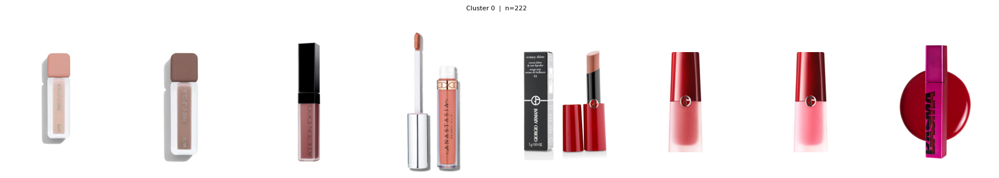


========== Cluster 1 (n=209) ==========


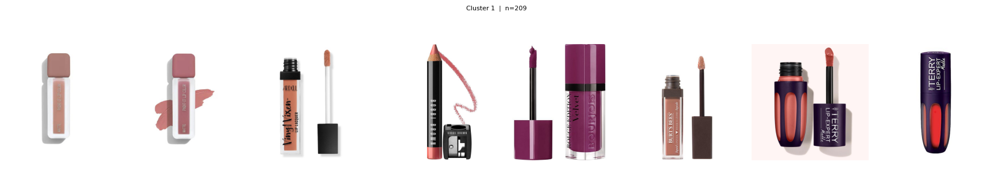


========== Cluster 2 (n=128) ==========


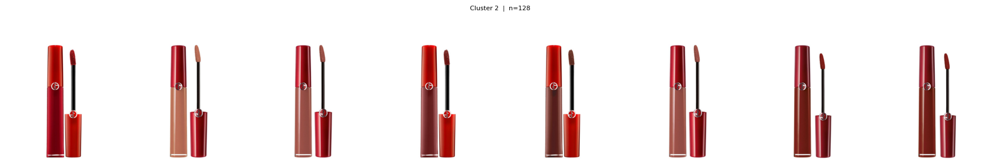


========== Cluster 3 (n=50) ==========


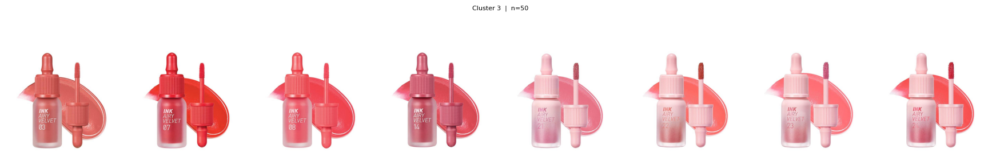


========== Cluster 4 (n=40) ==========


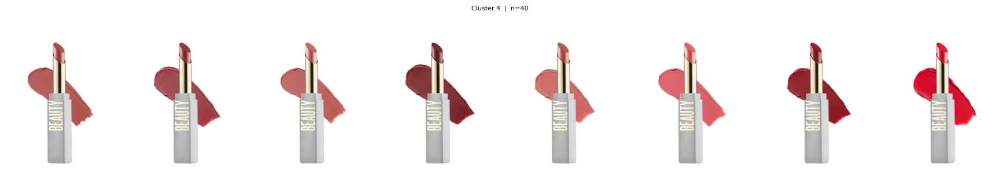


========== Cluster 5 (n=84) ==========


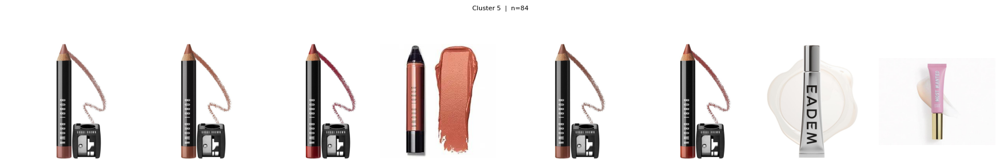


========== Cluster 6 (n=166) ==========


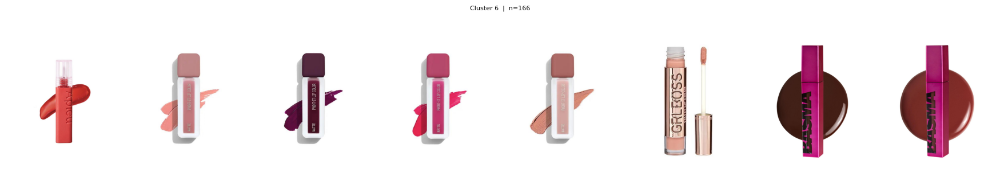


========== Cluster 7 (n=177) ==========


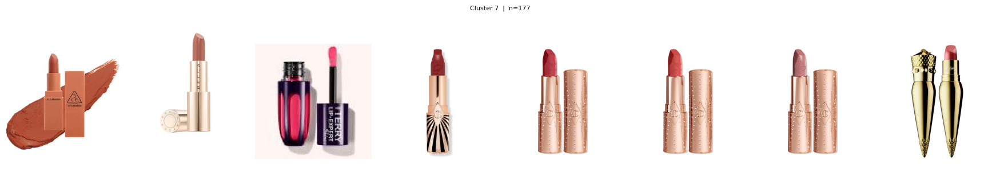


========== Cluster 8 (n=81) ==========


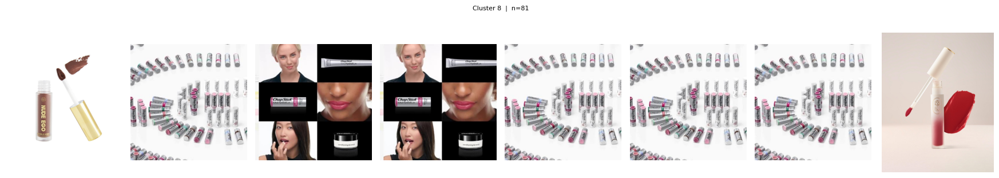


========== Cluster 9 (n=186) ==========


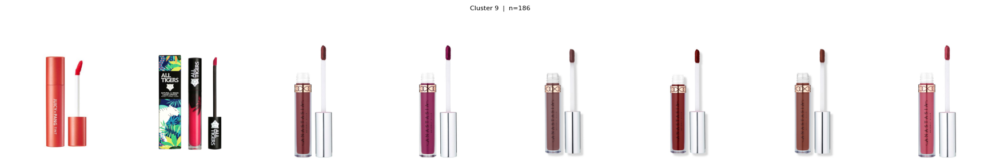


========== Cluster 10 (n=126) ==========


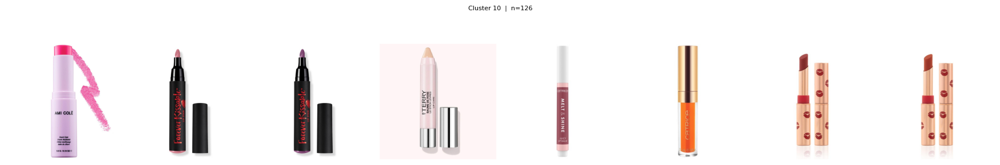


========== Cluster 11 (n=170) ==========


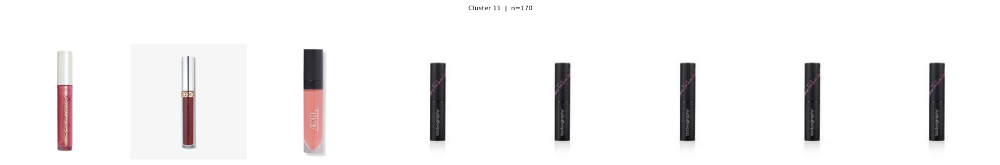


========== Cluster 12 (n=76) ==========


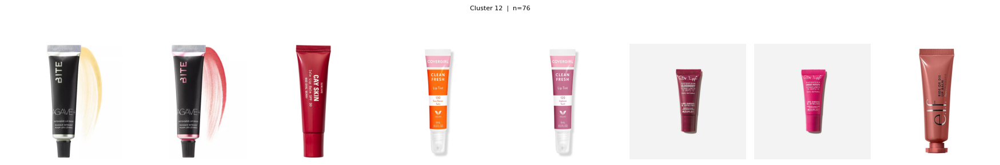


========== Cluster 13 (n=238) ==========


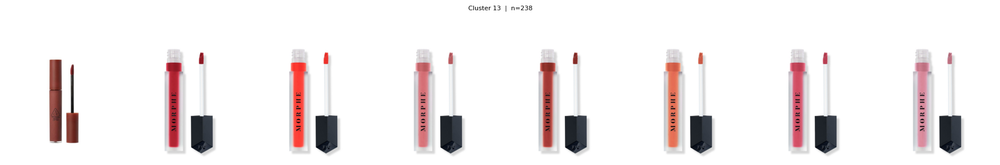


========== Cluster 14 (n=264) ==========


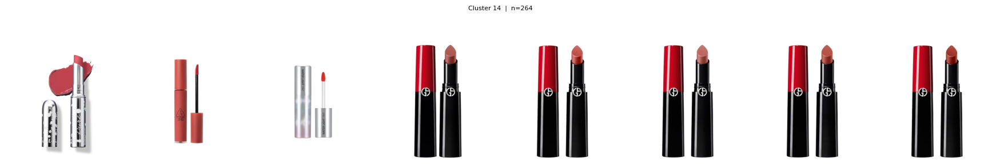


========== Cluster 15 (n=158) ==========


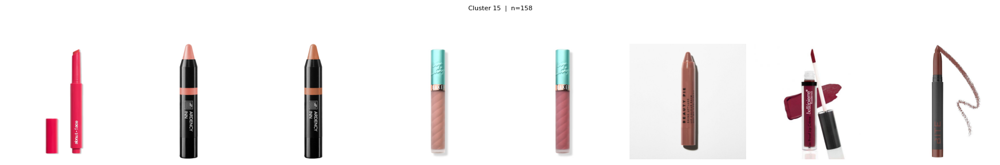


========== Cluster 16 (n=111) ==========


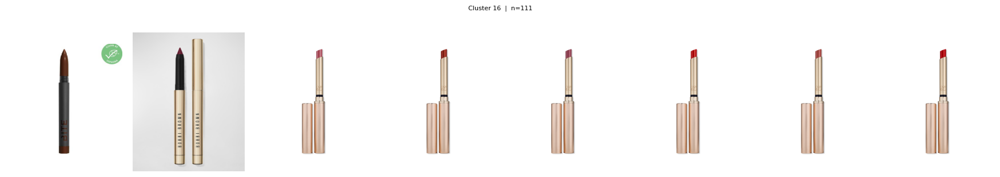


========== Cluster 17 (n=189) ==========


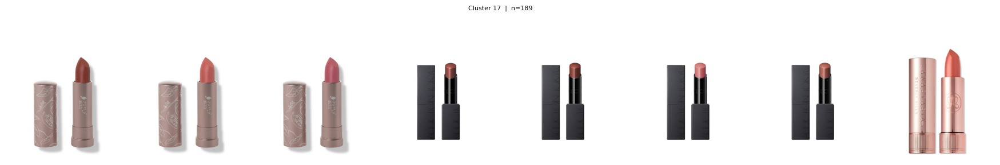


========== Cluster 18 (n=210) ==========


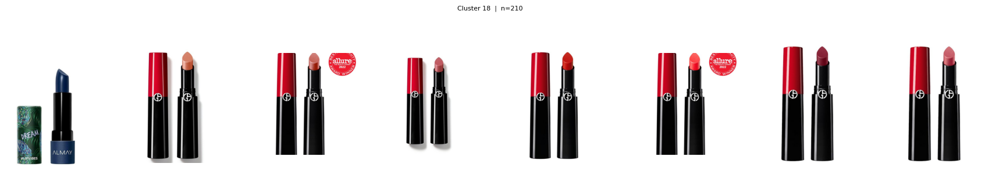


========== Cluster 19 (n=240) ==========


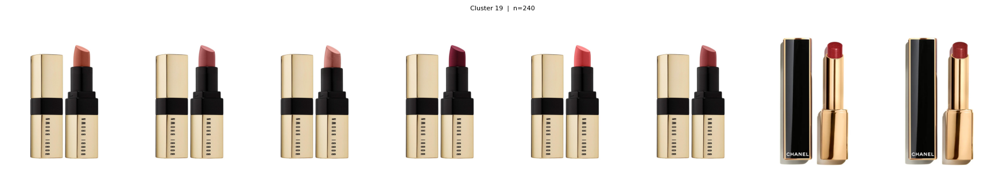


========== Cluster 20 (n=190) ==========


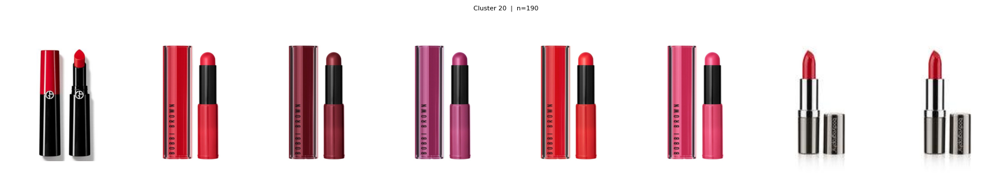


========== Cluster 21 (n=221) ==========


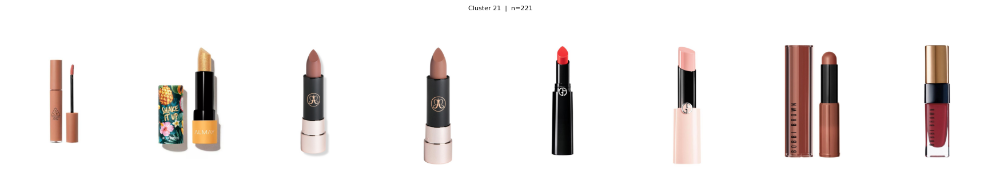


========== Cluster 22 (n=125) ==========


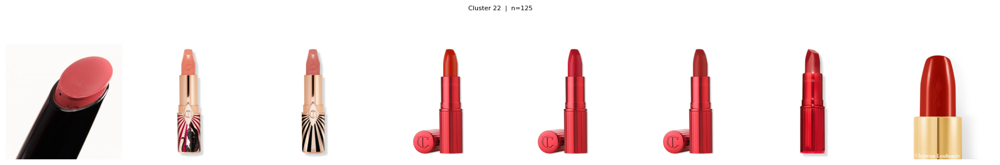


========== Cluster 23 (n=118) ==========


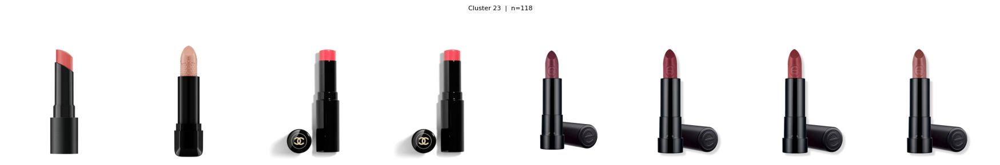


========== Cluster 24 (n=411) ==========


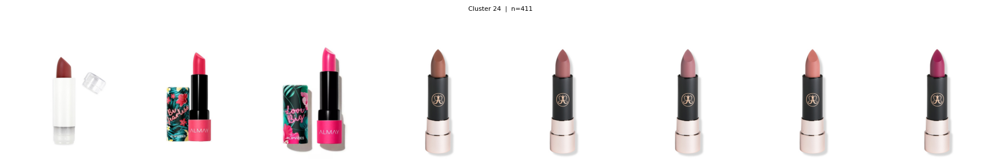


========== Cluster 25 (n=413) ==========


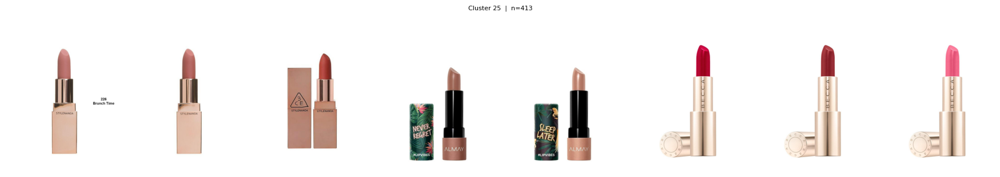


========== Cluster 26 (n=31) ==========


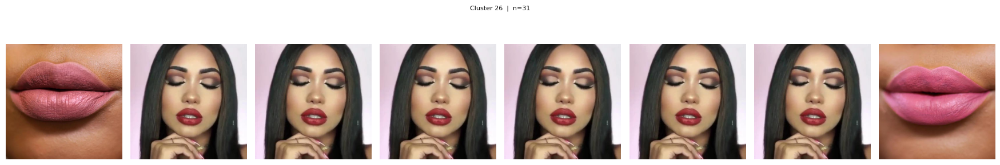


========== Cluster 27 (n=265) ==========


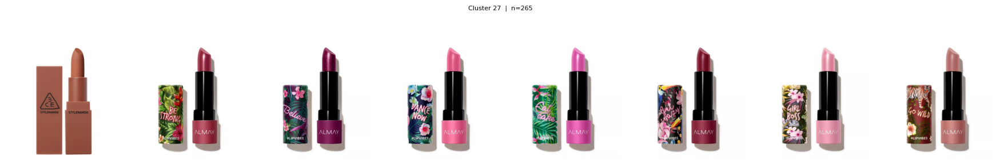


========== Cluster 28 (n=209) ==========


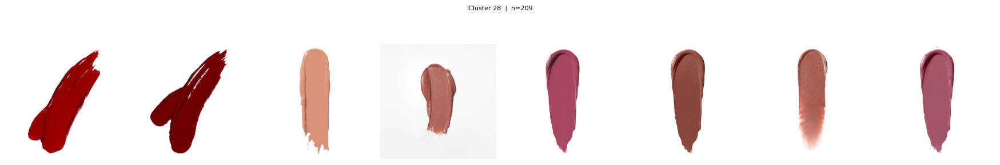


========== Cluster 29 (n=224) ==========


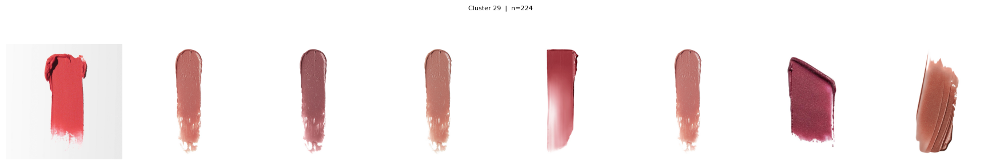


========== Cluster 30 (n=123) ==========


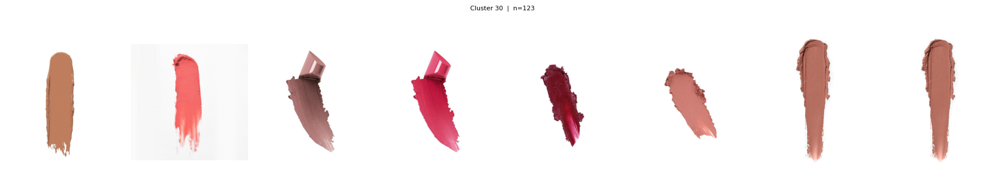


========== Cluster 31 (n=180) ==========


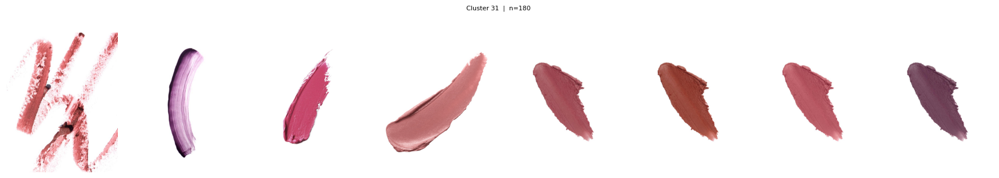


========== Cluster 32 (n=172) ==========


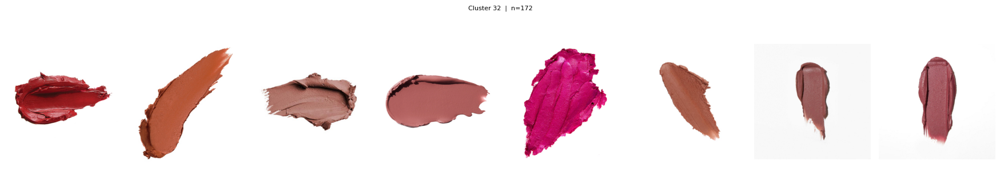


========== Cluster 33 (n=66) ==========


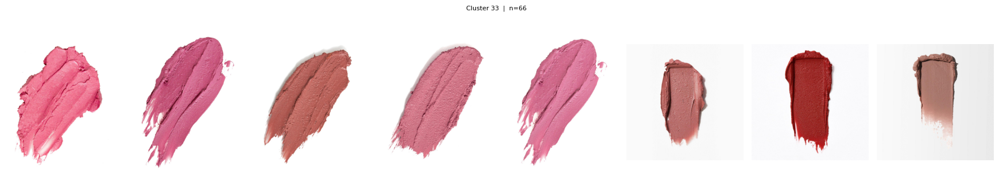


========== Cluster 34 (n=172) ==========


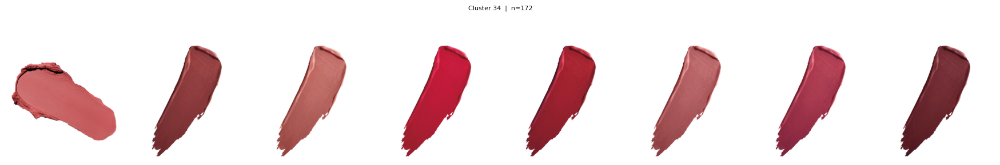


========== Cluster 35 (n=107) ==========


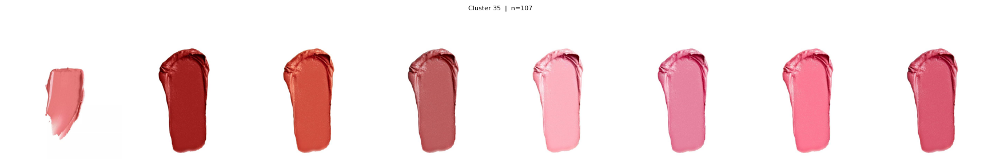


========== Cluster 36 (n=210) ==========


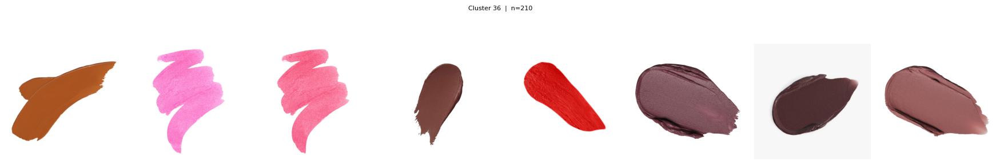


========== Cluster 37 (n=206) ==========


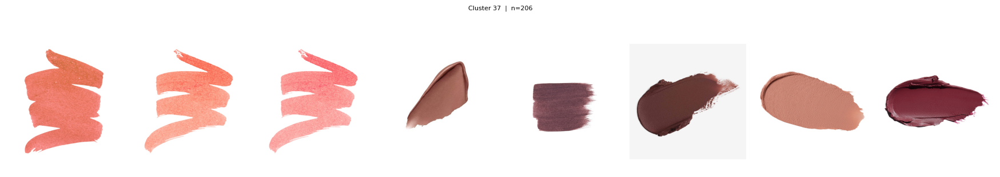


========== Cluster 38 (n=196) ==========


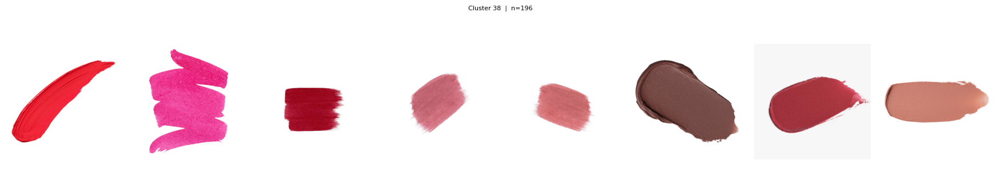


========== Cluster 39 (n=191) ==========


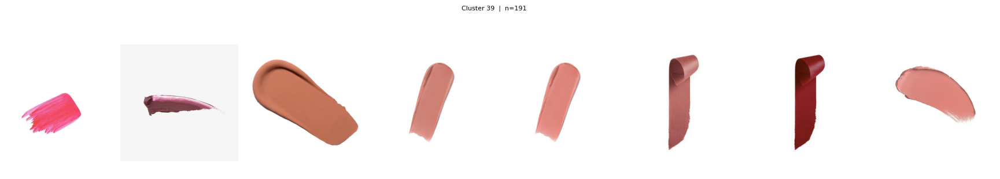


========== Cluster 40 (n=99) ==========


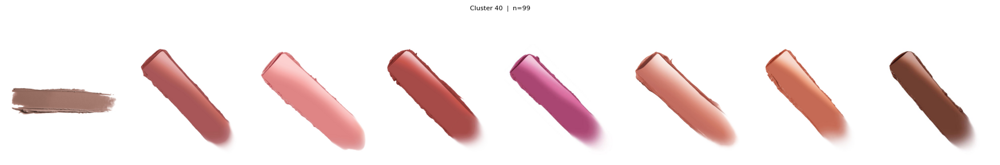


========== Cluster 41 (n=205) ==========


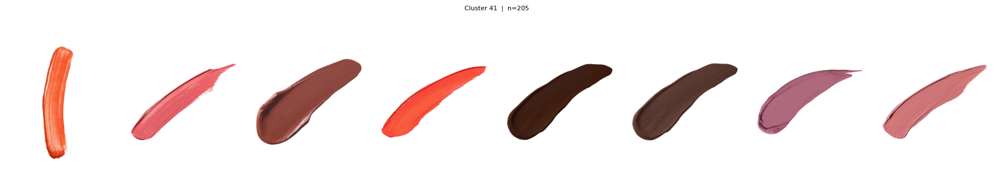


========== Cluster 42 (n=142) ==========


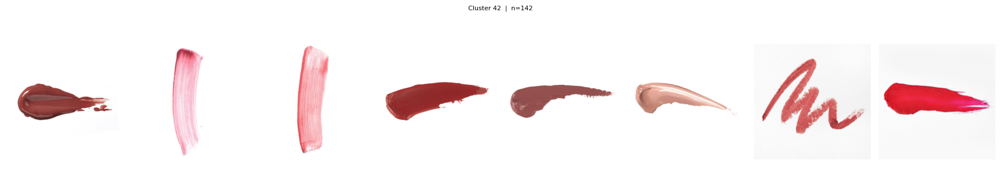


========== Cluster 43 (n=218) ==========


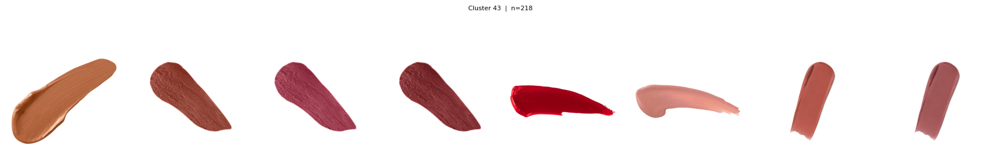


========== Cluster 44 (n=121) ==========


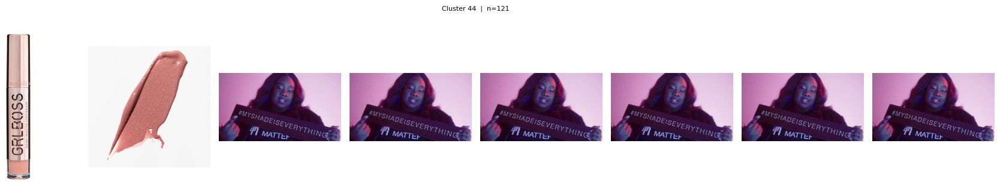


========== Cluster 45 (n=222) ==========


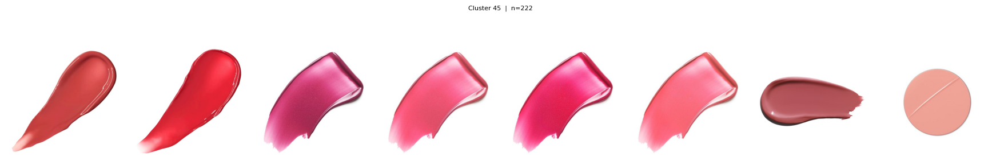


========== Cluster 46 (n=166) ==========


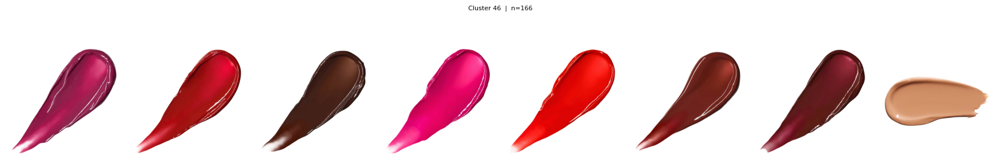


========== Cluster 47 (n=105) ==========


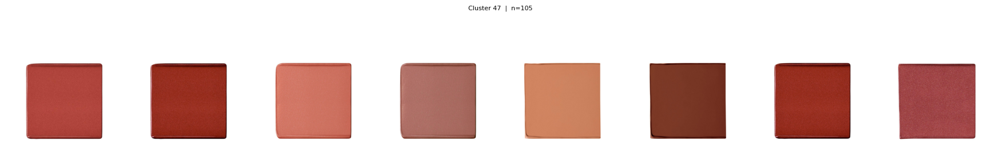


========== Cluster 48 (n=141) ==========


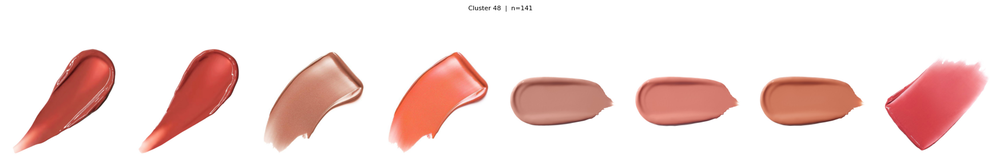


========== Cluster 49 (n=145) ==========


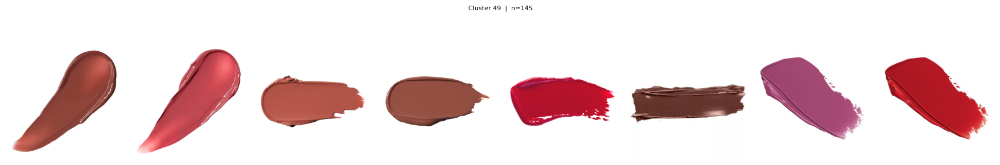

In [11]:
# Visual inspection: N_SHOW exemplars per cluster, to support the manual
# labeling in the next cell.
N_SHOW = 8

for c in sorted(embed_df['cluster'].unique()):
    grp = embed_df[embed_df['cluster'] == c]

    print(f'\n{"=" * 10} Cluster {c} (n={len(grp)}) {"=" * 10}')

    show = grp['stem'].tolist()[:N_SHOW]
    ncols = len(show)
    fig, axes = plt.subplots(1, ncols, figsize=(2.2 * ncols, 3))
    axes = np.array(axes).reshape(-1)
    fig.suptitle(f'Cluster {c}  |  n={len(grp)}', fontsize=8, y=1.02)
    for ax, stem in zip(axes, show):
        path = next(
            (os.path.join(CLEAN, stem + ext) for ext in ['.jpg', '.png', '.webp']
             if os.path.exists(os.path.join(CLEAN, stem + ext))),
            None
        )
        if path:
            ax.imshow(Image.open(path).convert('RGB'))
        ax.axis('off')
    for ax in axes[len(show):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [12]:
# ── manual cluster labeling — from visual inspection of the grids above ─────
# Step 1: coarse split. Swatches don't need a segmentation mask and are
# visually unambiguous, same heuristic as notebook 03_a.
SWATCH_CLUSTERS = {28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49}

# Step 2: every cluster NOT in SWATCH_CLUSTERS gets one of the finer types.
# Use the canonical class names only (never a synonym — see CLAUDE.md):
# 'bullet', 'closed', 'liquid', 'pencil', 'lips', 'unclassifiable'.
NOT_SWATCH_TYPE = {
    0: 'closed', 1: 'closed', 6: 'closed', 11: 'closed',
    2: 'liquid', 3: 'liquid', 9: 'liquid', 13: 'liquid',
    4: 'bullet', 7: 'bullet', 14: 'bullet', 16: 'bullet', 17: 'bullet',
    18: 'bullet', 19: 'bullet', 20: 'bullet', 21: 'bullet', 22: 'bullet',
    23: 'bullet', 24: 'bullet', 25: 'bullet', 27: 'bullet',
    5: 'pencil', 10: 'pencil', 15: 'pencil',
    8: 'unclassifiable', 12: 'unclassifiable', 44: 'unclassifiable',
    26: 'lips',  # covers shots with or without the model's face visible
}

found_clusters = sorted(embed_df['cluster'].unique())
missing = [c for c in found_clusters if c not in SWATCH_CLUSTERS and c not in NOT_SWATCH_TYPE]
assert not missing, f'label these clusters before proceeding: {missing}'

CLUSTER_TYPE = {c: 'swatch' for c in SWATCH_CLUSTERS}
CLUSTER_TYPE.update(NOT_SWATCH_TYPE)
embed_df['type'] = embed_df['cluster'].map(CLUSTER_TYPE)

pool = pool.merge(embed_df[['stem', 'cluster', 'type']], on='stem', how='left')
assert pool['type'].notna().all(), 'every pool image should have gotten a cluster -> type label'

print(pool['type'].value_counts())

type
swatch            3499
bullet            2974
closed             767
liquid             602
pencil             368
unclassifiable     278
lips                31
Name: count, dtype: int64


In [13]:
# The 7 canonical presentation-type classes (CLAUDE.md). Order doesn't matter
# here — this is just the set of names to compute a floor for, not a mapping to
# model output indices, so there's no drift risk in listing them directly.
classes = ['bullet', 'closed', 'lips', 'liquid', 'pencil', 'swatch', 'unclassifiable']


def per_class_floor(class_name, N_pool):
    """max over applicable metrics of the FPC-corrected sample size."""
    reqs = []
    for _, r in priors.iterrows():
        scope = METRIC_CLASSES[r['metric']]
        if scope != 'all' and class_name not in scope:
            continue
        reqs.append(fpc(r['n0'], N_pool))
    return int(np.ceil(max(reqs))) if reqs else 0


rows = []
for c in classes:
    n_pool = int((pool['type'] == c).sum())
    rows.append({'class': c, 'N_pool': n_pool, 'n_floor': per_class_floor(c, n_pool)})
floors_df = pd.DataFrame(rows).set_index('class')
floors_df['short'] = floors_df['n_floor'] > floors_df['N_pool']

N_CORE = int(floors_df['n_floor'].sum())

print(floors_df.to_string())
print(f'\ncore target -> {N_CORE}')
if floors_df['short'].any():
    print('shortfall (pool cannot meet the floor for): ' + ', '.join(floors_df.index[floors_df['short']]))

                N_pool  n_floor  short
class                                 
bullet            2974       61  False
closed             767       58  False
lips                31       20  False
liquid             602       56  False
pencil             368       53  False
swatch            3499       61  False
unclassifiable     278       46  False

core target -> 355


In [14]:
def draw_core(cand_df, n_total, seed=SEED):
    """Random sample stratified by visual type, proportional to the pool
    (representative — no per-class floor). Returns a copy tagged block='core'."""
    if n_total >= len(cand_df):
        out = cand_df.copy()
    else:
        share = cand_df['type'].value_counts(normalize=True)
        alloc = (share * n_total).round().astype(int).clip(lower=0)
        out = (cand_df.groupby('type', group_keys=False)
               .apply(lambda g: g.sample(n=min(int(alloc.get(g.name, 0)), len(g)), random_state=seed)))
    out = out.copy()
    out['block'] = 'core'
    return out


core = draw_core(pool, N_CORE)
print(f'core sample: {len(core)}')
print('\ncore type vs floor:')
_ct = core['type'].value_counts()
print(pd.DataFrame({'core_type': _ct, 'floor': floors_df['n_floor']}).fillna(0).astype(int).to_string())

core sample: 355

core type vs floor:
                core_type  floor
bullet                124     61
closed                 32     58
lips                    1     20
liquid                 25     56
pencil                 15     53
swatch                146     61
unclassifiable         12     46


In [15]:
# Top up any type whose *core* count falls below its statistical floor
# (typically lips, pencil, closed, unclassifiable). `type` comes from manual
# visual-cluster labeling, not the classifier under evaluation, so a random
# draw within the shortfall type doesn't bias that class's apparent accuracy.
def draw_type_boost(cand_df, core_df, seed=SEED):
    have = set(core_df['img_name_disk'])
    picks = []
    for c in classes:
        core_n = int((core_df['type'] == c).sum())
        need = max(0, int(floors_df.loc[c, 'n_floor']) - core_n)
        if need == 0:
            continue
        avail = cand_df[(cand_df['type'] == c) & (~cand_df['img_name_disk'].isin(have))]
        picked = avail.sample(n=min(need, len(avail)), random_state=seed).copy()
        picked['block'] = 'type_boost'
        picks.append(picked)
    if not picks:
        return cand_df.iloc[0:0].assign(block=pd.Series(dtype=object))
    return pd.concat(picks, ignore_index=True)


type_boost = draw_type_boost(pool, core)
print('type_boost rows added:')
print(type_boost['type'].value_counts().to_string() if len(type_boost) else '  none')

type_boost rows added:
type
pencil            38
unclassifiable    34
liquid            31
closed            26
lips              19


In [16]:
WORKLIST_COLS = [
    'img_name_disk', 'id', 'joined', 'brand', 'product', 'shade',
    'cluster', 'type', 'block', 'priority',
    'needs_mask',
]


def _prep(df):
    df = df.copy()
    if 'priority' not in df.columns:
        df['priority'] = np.nan
    return df


parts = [_prep(core), _prep(type_boost)]
worklist = pd.concat(parts, ignore_index=True)
worklist = worklist.drop_duplicates('img_name_disk', keep='first')

worklist['needs_mask'] = worklist['type'] != 'unclassifiable'

# annotation order: core rows shuffled within type; boost rows numbered after
core_mask = worklist['block'] == 'core'
worklist.loc[core_mask, 'priority'] = worklist[core_mask].groupby('type').cumcount() + 1
_core_max = worklist.loc[core_mask, 'priority'].max()
worklist.loc[~core_mask, 'priority'] = np.arange(1, (~core_mask).sum() + 1) + (_core_max or 0)
worklist['priority'] = worklist['priority'].astype(int)

worklist = worklist[WORKLIST_COLS].sort_values(['block', 'priority']).reset_index(drop=True)

assert worklist['img_name_disk'].is_unique

worklist.to_csv(os.path.join(ANN_SAM, 'eval_worklist.csv'), index=False)
print(f'wrote eval_worklist.csv  ({len(worklist)} rows)\n')
print(worklist['block'].value_counts().to_string())
print('\nby block x type:')
print(pd.crosstab(worklist['block'], worklist['type']).to_string())

wrote eval_worklist.csv  (503 rows)

block
core          355
type_boost    148

by block x type:
type        bullet  closed  lips  liquid  pencil  swatch  unclassifiable
block                                                                   
core           124      32     1      25      15     146              12
type_boost       0      26    19      31      38       0              34


### Copy worklist images for Label Studio

`eval_worklist.csv` references images by `img_name_disk` but doesn't move any
files — copy each one from `original_clean/` into `data/img/eval_worklist/` so
Label Studio can be pointed at a folder containing only what needs annotating.

In [ ]:
EVAL_IMG_DIR = os.path.join(BASE, 'img', 'eval_worklist')
os.makedirs(EVAL_IMG_DIR, exist_ok=True)

copied, skipped, missing = 0, 0, []
for img_name in worklist['img_name_disk']:
    dst = os.path.join(EVAL_IMG_DIR, img_name)
    if os.path.exists(dst):
        skipped += 1
        continue
    src = os.path.join(CLEAN, img_name)
    if not os.path.exists(src):
        missing.append(img_name)
        continue
    shutil.copy2(src, dst)
    copied += 1

print(f'Copied:  {copied}')
print(f'Skipped (already present): {skipped}')
print(f'Missing from original_clean: {len(missing)}')
if missing:
    for name in missing:
        print(f'  {name}')

### Caveats for evaluation

- **Cluster labeling is manual and coarse.** `type` is assigned per *cluster*,
  not per image, so a cluster that's mostly one presentation style can still
  contain a few mislabeled outliers. `type` only drives sampling — evaluation
  is scored against the manually annotated `true_label`, not against `type`.
- **Thin segmenter support.** `closed`, `lips`, and `pencil` have no dedicated
  segmenter data floor in notebook 06, so their IoU intervals will be wide even at
  the target sample size.

In [17]:
# ── sanity checks on the sampling plan ──────────────────────────────────────
wl = pd.read_csv(os.path.join(ANN_SAM, 'eval_worklist.csv'))

assert not wl['img_name_disk'].apply(normalize_stem).isin(exclusion).any(), 'worklist leaks training image'
assert wl['img_name_disk'].apply(lambda f: os.path.exists(os.path.join(CLEAN, f))).all(), 'worklist image missing on disk'
assert wl['img_name_disk'].is_unique
assert wl['type'].notna().all(), 'worklist row missing a type label'
print('all sampling-plan assertions passed')

# representativeness: core type mix vs pool (this is the axis core was drawn on)
core_wl = wl[wl.block == 'core']
rep_type = pd.DataFrame({
    'pool_%': pool['type'].value_counts(normalize=True) * 100,
    'core_worklist_%': core_wl['type'].value_counts(normalize=True) * 100,
}).fillna(0).round(1)
print('\ntype representativeness:')
print(rep_type.to_string())

_obs = core_wl['type'].value_counts()
_exp = pool['type'].value_counts().reindex(_obs.index).fillna(0)
_exp = _exp / _exp.sum() * _obs.sum()
_chi, _p = stats.chisquare(_obs.values, _exp.values)
print(f'\nchi-square GOF core vs pool (type): chi2={_chi:.1f}  p={_p:.3f}  '
      f'({"representative" if _p > 0.05 else "deviates — check allocation"})')

print(f'\nSCENARIO={SCENARIO}  pool={len(pool)}  core={len(wl[wl.block=="core"])}  '
      f'type_boost={len(wl[wl.block=="type_boost"])}')

all sampling-plan assertions passed

type representativeness:
                pool_%  core_worklist_%
type                                   
swatch            41.1             41.1
bullet            34.9             34.9
closed             9.0              9.0
liquid             7.1              7.0
pencil             4.3              4.2
unclassifiable     3.3              3.4
lips               0.4              0.3

chi-square GOF core vs pool (type): chi2=0.1  p=1.000  (representative)

SCENARIO=target  pool=8519  core=355  type_boost=148


### Duplicate detection in the annotated sample

Some sellers upload the exact same product image for multiple listings, so a
handful of files in `data/img/eval_worklist/` are pixel-identical despite
having different `img_name_disk` values. Detect these by hashing each image's
decoded pixel content (not the raw file bytes, so an identical image re-saved
with different JPEG metadata still matches) and flag every member of a group
that has more than one match.

Adds two columns to `eval_worklist.csv`:
- `duplicate_group_id` — an id shared by all images with identical pixel
  content (blank if the image is unique)
- `is_duplicate` — 1 if the image shares its `duplicate_group_id` with at
  least one other row, 0 otherwise


In [4]:
import hashlib
from collections import defaultdict

EVAL_IMG_DIR = os.path.join(BASE, 'img', 'eval_worklist')
wl = pd.read_csv(os.path.join(ANN_SAM, 'eval_worklist.csv'))

hashes = {}
missing_files = []
for img_name in wl['img_name_disk']:
    path = os.path.join(EVAL_IMG_DIR, img_name)
    if not os.path.exists(path):
        missing_files.append(img_name)
        continue
    with Image.open(path) as im:
        hashes[img_name] = hashlib.md5(im.convert('RGB').tobytes()).hexdigest()

if missing_files:
    print(f'Warning: {len(missing_files)} images in eval_worklist.csv not found in {EVAL_IMG_DIR}')
    for name in missing_files:
        print(f'  {name}')

groups = defaultdict(list)
for img_name, h in hashes.items():
    groups[h].append(img_name)

dup_groups = {h: names for h, names in groups.items() if len(names) > 1}

img_to_group_id = {}
for group_id, names in enumerate(dup_groups.values(), start=1):
    for name in names:
        img_to_group_id[name] = group_id

wl['duplicate_group_id'] = wl['img_name_disk'].map(img_to_group_id)
wl['is_duplicate'] = wl['duplicate_group_id'].notna().astype(int)

wl.to_csv(os.path.join(ANN_SAM, 'eval_worklist.csv'), index=False)

print(f'Images hashed: {len(hashes)}')
print(f'Duplicate groups: {len(dup_groups)}')
print(f'Images flagged as duplicates: {wl["is_duplicate"].sum()}')


Images hashed: 503
Duplicate groups: 5
Images flagged as duplicates: 20


## How to run

```bash
.venv/bin/python -m jupyter nbconvert --to notebook --execute --inplace \
  notebooks/04_a_validation_set_strategy.ipynb
```

Writes `data/annotation_sample/eval_worklist.csv`. From there: annotate it in
Label Studio, run `04_b_validation_annotation_image.ipynb`.

**Lint:** `.venv/bin/python .claude/skills/check-notebooks/check_notebooks.py` —
no new errors from this notebook.

**Outputs:** `data/annotation_sample/eval_worklist.csv`.